# Predicting Future Crime Rates 

## Violent crime 

In [1]:
# importing necessary libraries and configurations
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import itertools

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.api as sm

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric

import logging
import warnings

logging.getLogger("fbprophet").setLevel(logging.ERROR)
warnings.filterwarnings("ignore")
plt.style.use("seaborn")
%matplotlib inline

In [2]:
# loading the dataset
df = pd.read_csv("df_viol.csv")

In [3]:
# data cleaning and indexing
drop = ["latitude", "longitude"]

df.drop(drop, axis=1, inplace=True)
df.occurred_date = df.occurred_date.astype("datetime64")
df.set_index(["occurred_date"], inplace=True)
df.sort_index(inplace=True)

In [4]:
df.duplicated().sum()

0

In [5]:
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

## ARIMA modeling time series with Statsmodels

### Examining an overall picture of violent crime in Austin first.

In [6]:
monthly = pd.DataFrame(
    df[df["highest_offense_description"] == "AGG ASSAULT"].resample("M").size()
)
monthly.columns = ["AGG ASSAULT"]

for i in df["highest_offense_description"].unique():
    monthly[i] = pd.DataFrame(
        df[df["highest_offense_description"] == i].resample("M").size()
    )

monthly["TOTAL"] = monthly.sum(axis=1)

crimeType = monthly.columns

display(monthly.head())
display(monthly.tail())

,AGG ASSAULT,RAPE,AGG SEXUAL ASSAULT CHILD/OBJEC,AGG ROBBERY/DEADLY WEAPON,AGG ASSAULT FAM/DATE VIOLENCE,AGG ASLT W/MOTOR VEH FAM/DAT V,AGG ASSAULT WITH MOTOR VEH,AGG ASSAULT ON PUBLIC SERVANT,MURDER,AGG ROBBERY BY ASSAULT,AGG RAPE OF A CHILD,EXPIRED-ATT MURDER,AGG SEXUAL ASSAULT W OBJECT,CAPITAL MURDER,EXPIRED-ATT CAPITAL MURDER,CRASH/MURDER,AGG ASLT STRANGLE/SUFFOCATE,AGG ASLT ENHANC STRANGL/SUFFOC,TOTAL
occurred_date,,,,,,,,,,,,,,,,,,,
2003-01-31,60,10.0,11.0,26.0,37.0,2.0,6.0,4.0,3.0,3.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164.0
2003-02-28,36,6.0,2.0,32.0,30.0,0.0,5.0,2.0,2.0,3.0,3.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,122.0
2003-03-31,56,14.0,0.0,47.0,39.0,4.0,10.0,2.0,3.0,4.0,0.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,181.0
2003-04-30,69,9.0,5.0,39.0,36.0,1.0,7.0,2.0,3.0,5.0,4.0,1.0,3.0,1.0,NaN,NaN,NaN,NaN,185.0
2003-05-31,59,12.0,3.0,29.0,49.0,3.0,15.0,1.0,1.0,8.0,2.0,NaN,2.0,0.0,NaN,NaN,NaN,NaN,184.0


,AGG ASSAULT,RAPE,AGG SEXUAL ASSAULT CHILD/OBJEC,AGG ROBBERY/DEADLY WEAPON,AGG ASSAULT FAM/DATE VIOLENCE,AGG ASLT W/MOTOR VEH FAM/DAT V,AGG ASSAULT WITH MOTOR VEH,AGG ASSAULT ON PUBLIC SERVANT,MURDER,AGG ROBBERY BY ASSAULT,AGG RAPE OF A CHILD,EXPIRED-ATT MURDER,AGG SEXUAL ASSAULT W OBJECT,CAPITAL MURDER,EXPIRED-ATT CAPITAL MURDER,CRASH/MURDER,AGG ASLT STRANGLE/SUFFOCATE,AGG ASLT ENHANC STRANGL/SUFFOC,TOTAL
occurred_date,,,,,,,,,,,,,,,,,,,
2021-01-31,92,15.0,1.0,74.0,44.0,3.0,4.0,3.0,4.0,1.0,1.0,NaN,0.0,NaN,NaN,NaN,55.0,1.0,298.0
2021-02-28,89,10.0,0.0,31.0,33.0,2.0,4.0,NaN,6.0,2.0,1.0,NaN,2.0,NaN,NaN,NaN,51.0,2.0,233.0
2021-03-31,96,20.0,3.0,40.0,30.0,3.0,3.0,NaN,8.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,45.0,4.0,254.0
2021-04-30,106,17.0,NaN,38.0,25.0,2.0,2.0,NaN,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,56.0,11.0,265.0
2021-05-31,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


-----------------------------------------------------------------
Calculating and plotting time series with moving average included
-----------------------------------------------------------------


ValueError: num must be 1 <= num <= 15, not 0

<Figure size 432x288 with 0 Axes>

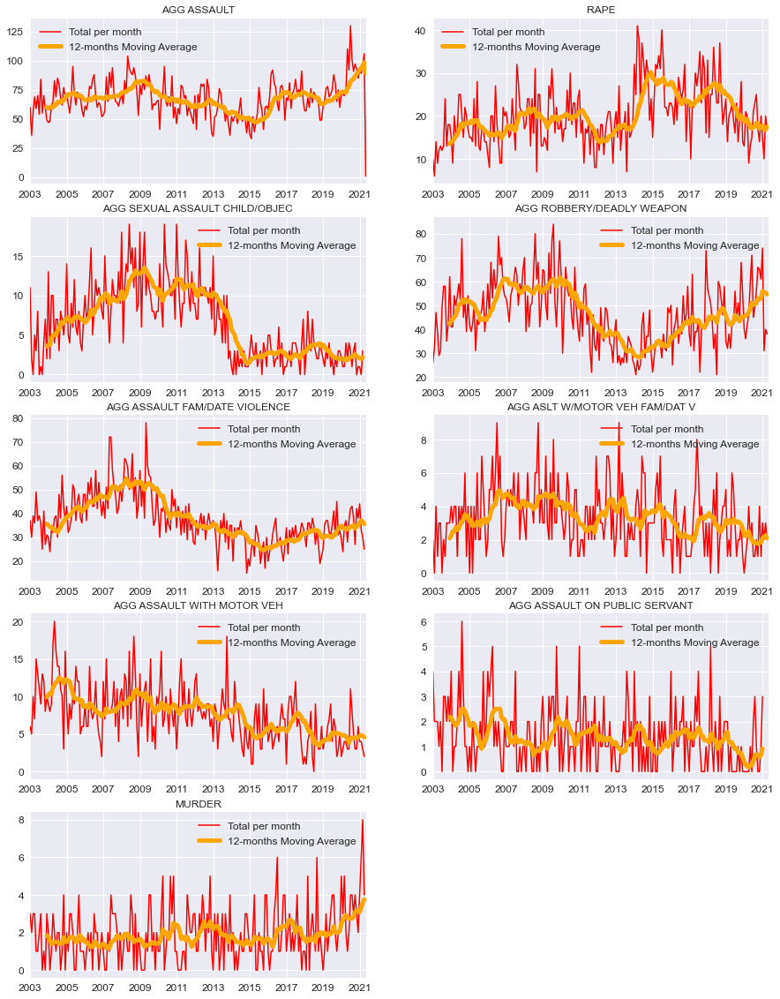

In [7]:
print("-----------------------------------------------------------------")
print("Calculating and plotting time series with moving average included")
print("-----------------------------------------------------------------")
plt.figure(1)
plt.figure(figsize=(15, 20))

i = 521
for eachCrime in crimeType:
    plt.subplot(i)
    monthly[eachCrime].plot(color="red", linewidth=1.5, label="Total per month")
    monthly[eachCrime].rolling(window=12).mean().plot(
        color="orange", linewidth=5, label="12-months Moving Average"
    )
    plt.title(eachCrime, fontsize=12)
    plt.xlabel("")
    plt.legend(prop={"size": 12})
    plt.tick_params(labelsize=12)
    i = i + 1
plt.show()

print("-----------------------------------------------")
print(" Calculating and visualizing the 1st difference")
print("-----------------------------------------------")
# Initiate the figure and define size
plt.figure(1)
plt.figure(figsize=(15, 20))

# Using a for loop to plot each type of crime with a moving average
i = 521
for eachCrime in crimeType:
    plt.subplot(i)
    monthly[eachCrime].diff().plot(color="red", linewidth=1.5, label="1st Difference")
    monthly[eachCrime].rolling(window=12).mean().diff().plot(
        color="orange", linewidth=5, label="12-months Moving Average"
    )
    plt.title(eachCrime, fontsize=12)
    plt.xlabel("")
    plt.legend(prop={"size": 12})
    plt.tick_params(labelsize=12)
    i = i + 1

### Prepping the data for modeling  

In [8]:
# Create a data frame with the 1st difference

montlhy_1stDiff = monthly.diff().dropna()

# Create a data frame with the results of the ADF test for each type

adfullerResults = pd.DataFrame(
    columns=crimeType,
    index=["ADF", "Critical Value 1%", "Critical Value 5%", "p-value"],
)
for eachType in crimeType:
    adf = adfuller(montlhy_1stDiff[eachType])
    adfullerResults[eachType] = (
        "{:.4f}".format(adf[0]),
        "{:.4f}".format(adf[4]["1%"]),
        "{:.4f}".format(adf[4]["5%"]),
        "{:.4f}".format(adf[1]),
    )
adfullerResults

ValueError: sample size is too short to use selected regression component

'AGG ASSAULT'

ValueError: negative dimensions are not allowed

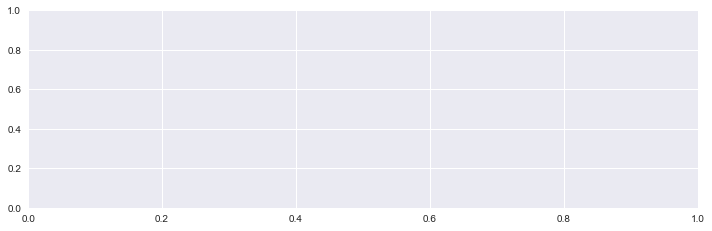

In [9]:
display(montlhy_1stDiff[crimeType[0]].name)
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(montlhy_1stDiff[crimeType[0]], lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(montlhy_1stDiff[crimeType[0]], lags=50, ax=ax2)

In [10]:
p = d = q = range(0, 2)

pdq = list(itertools.product(p, d, q))

seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print("Examples of parameter combinations for Seasonal ARIMA...")
print("SARIMAX: {} x {}".format(pdq[1], seasonal_pdq[1]))
print("SARIMAX: {} x {}".format(pdq[1], seasonal_pdq[2]))
print("SARIMAX: {} x {}".format(pdq[2], seasonal_pdq[3]))
print("SARIMAX: {} x {}".format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [11]:
# Creating a function to use a pipeline
def myArima(crimeTypeSeries):
    print("Training for:", crimeTypeSeries.name)
    lowestAIC = 999999999
    bestOrder = 0
    bestSeasonal_order = 0
    i = 0
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(
                    crimeTypeSeries, order=param, seasonal_order=param_seasonal
                )
                results = mod.fit()
                newAIC = results.aic
                if newAIC < lowestAIC:
                    lowestAIC = newAIC
                    bestOrder = param
                    bestSeasonal_order = param_seasonal
                i = i + 1
                print("\r", "Calculating: {:.0f}%".format(i / 64 * 100), end="")
            except:
                i = i + 1
                print("\r", "Calculating: {:.0f}%".format(i / 64 * 100), end="")
                continue
    print("\nBest parameters: SARIMA{}x{}12".format(param, param_seasonal))
    mod = sm.tsa.statespace.SARIMAX(
        crimeTypeSeries, order=bestOrder, seasonal_order=bestSeasonal_order
    )
    results = mod.fit()
    results.plot_diagnostics(figsize=(15, 12))
    plt.show()
    pred = results.get_prediction(start=168, end=218, dynamic=False)
    pred_ci = pred.conf_int()
    pred_ci.head()
    plt.figure(figsize=(15, 6))
    ax = crimeTypeSeries.plot(label="observed")
    plt.title("Actual and Forecast", fontsize=12)
    pred.predicted_mean.plot(
        ax=ax, label="One-step ahead forecast", color="red", alpha=0.7, lw=4
    )
    ax.fill_between(
        pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 1], color="r", alpha=0.3
    )
    ax.set_xlabel("Years")
    ax.set_ylabel("Number of crime")
    plt.legend()
    plt.show()
    return results

Training for: AGG ASSAULT
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


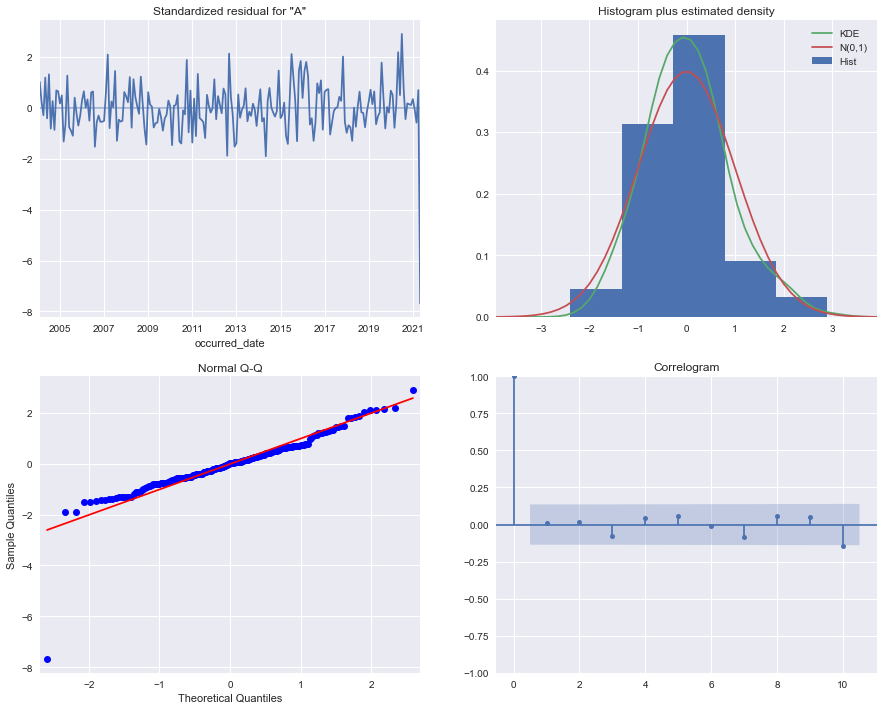

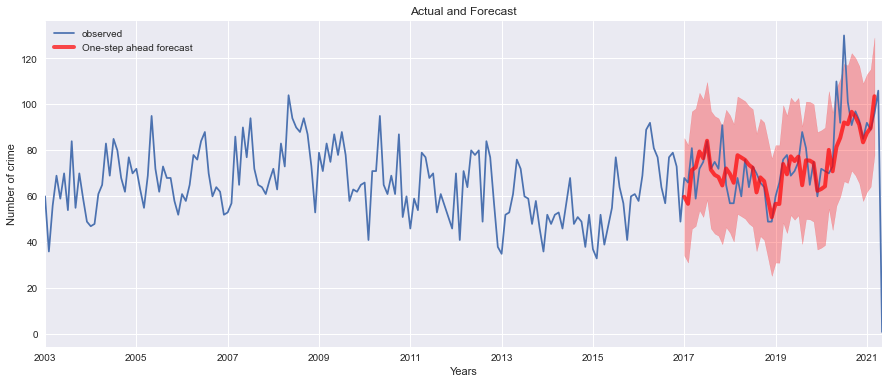

Training for: RAPE
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


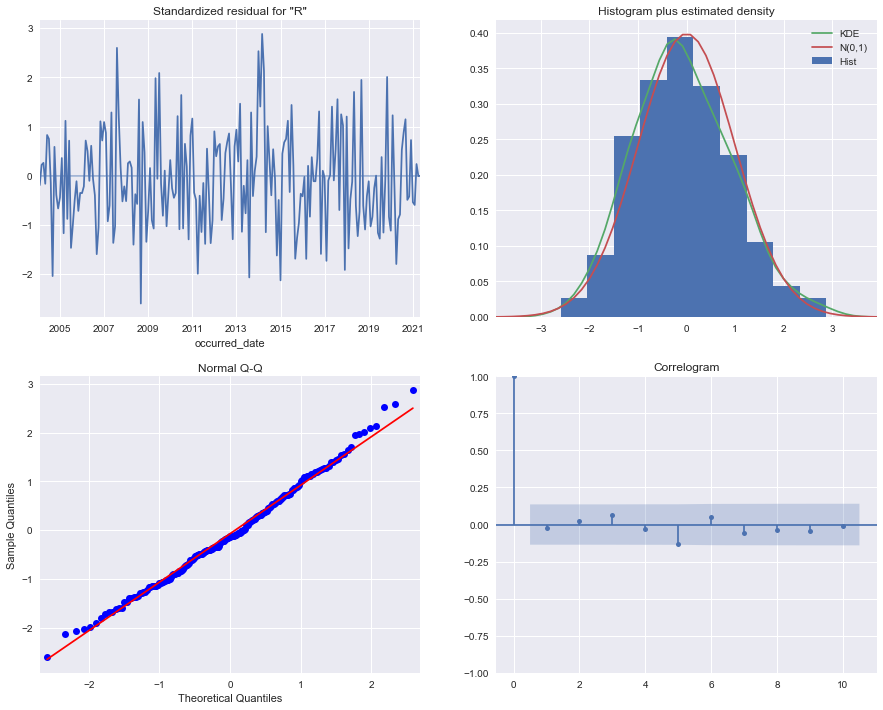

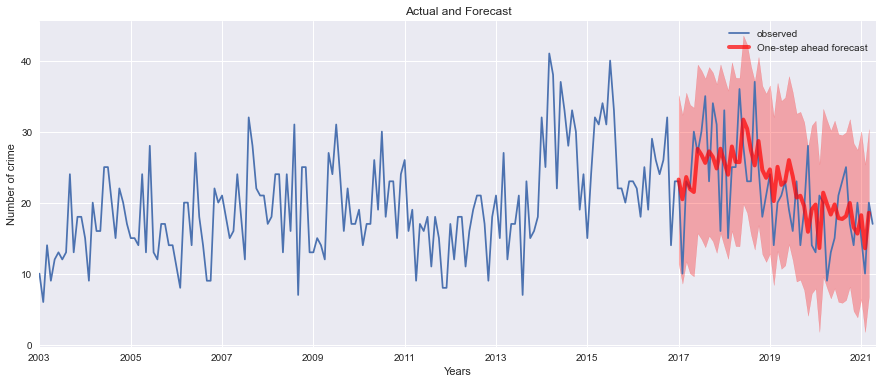

Training for: AGG SEXUAL ASSAULT CHILD/OBJEC
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


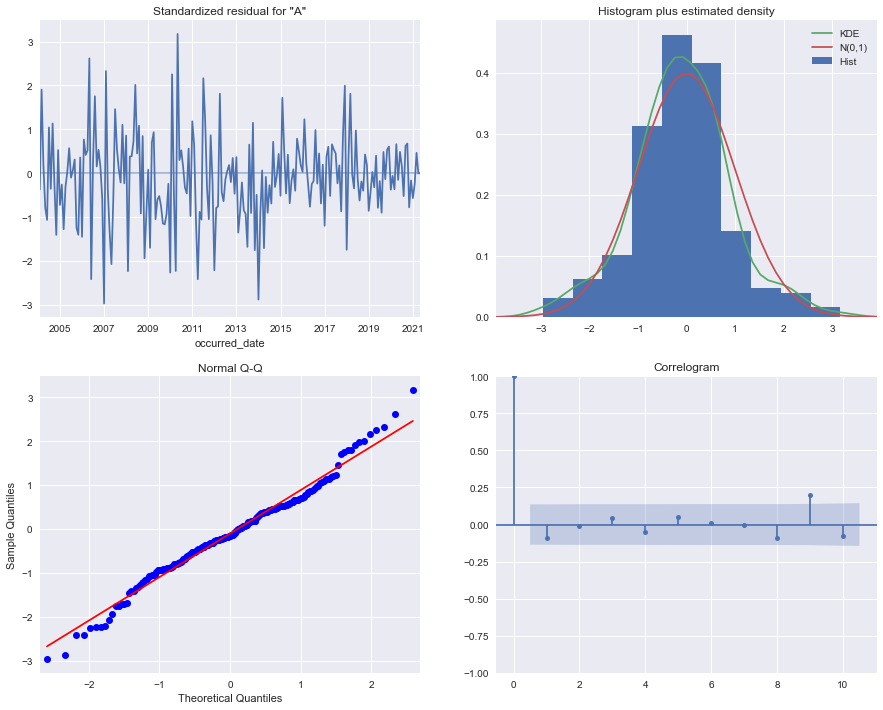

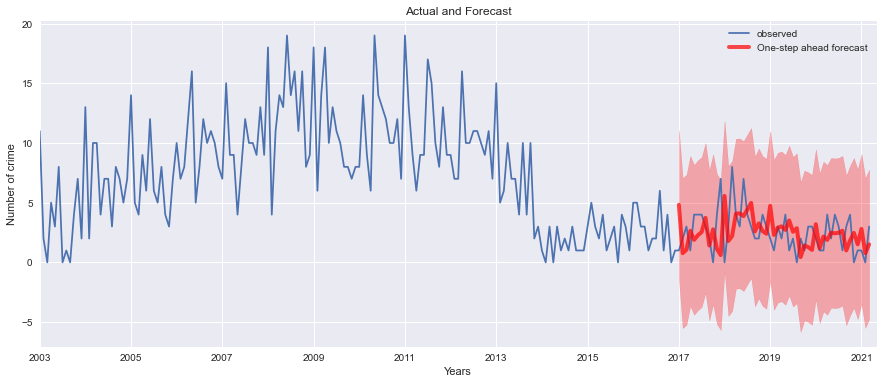

Training for: AGG ROBBERY/DEADLY WEAPON
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


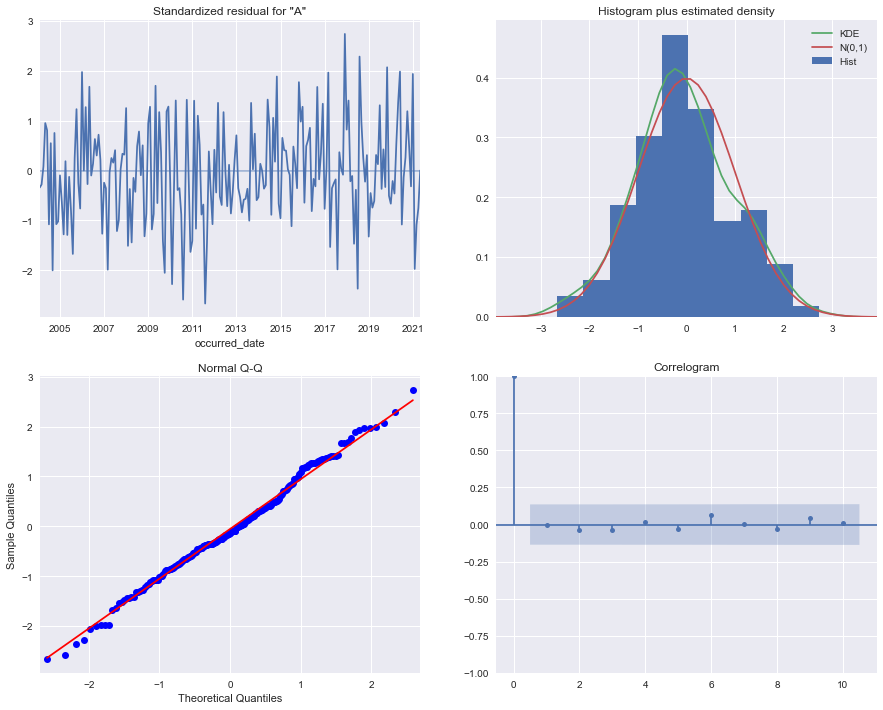

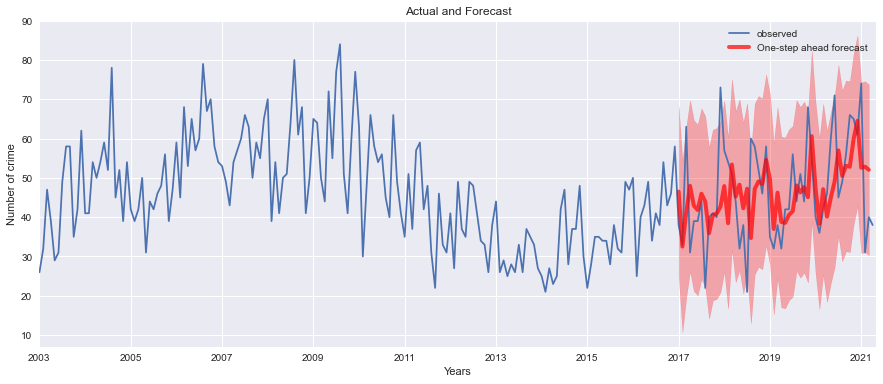

Training for: AGG ASSAULT FAM/DATE VIOLENCE
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


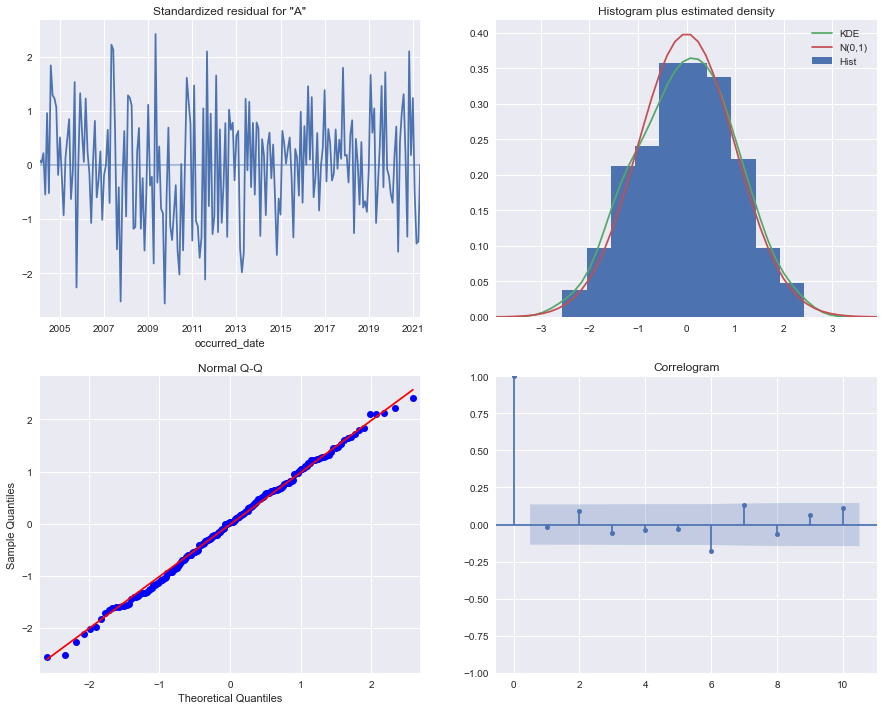

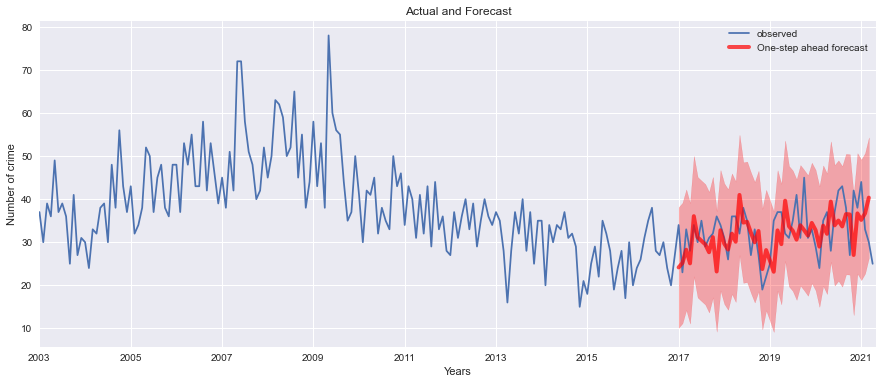

Training for: AGG ASLT W/MOTOR VEH FAM/DAT V
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


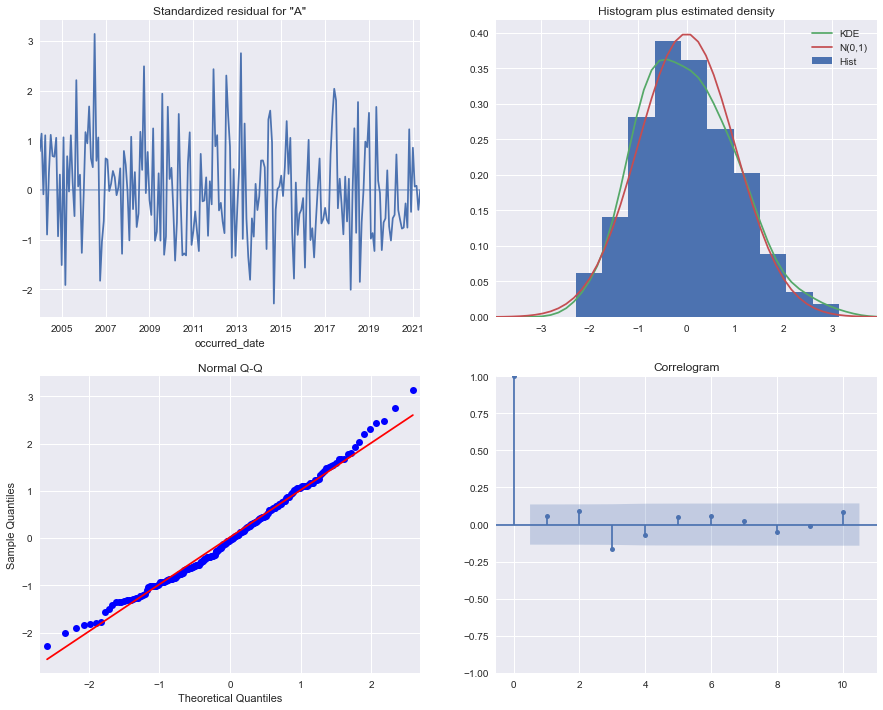

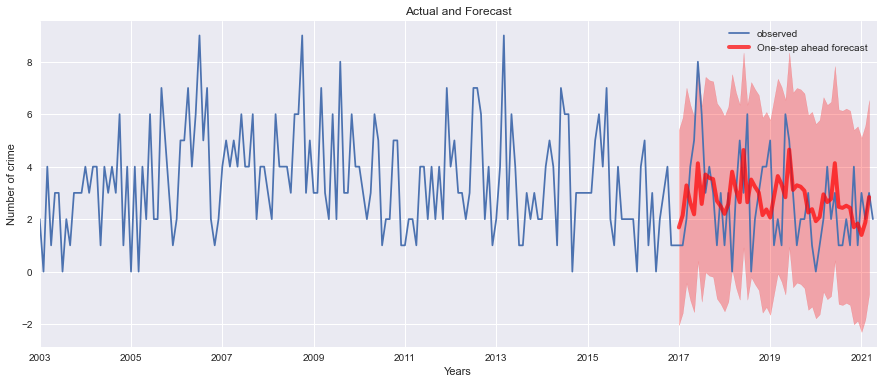

Training for: AGG ASSAULT WITH MOTOR VEH
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


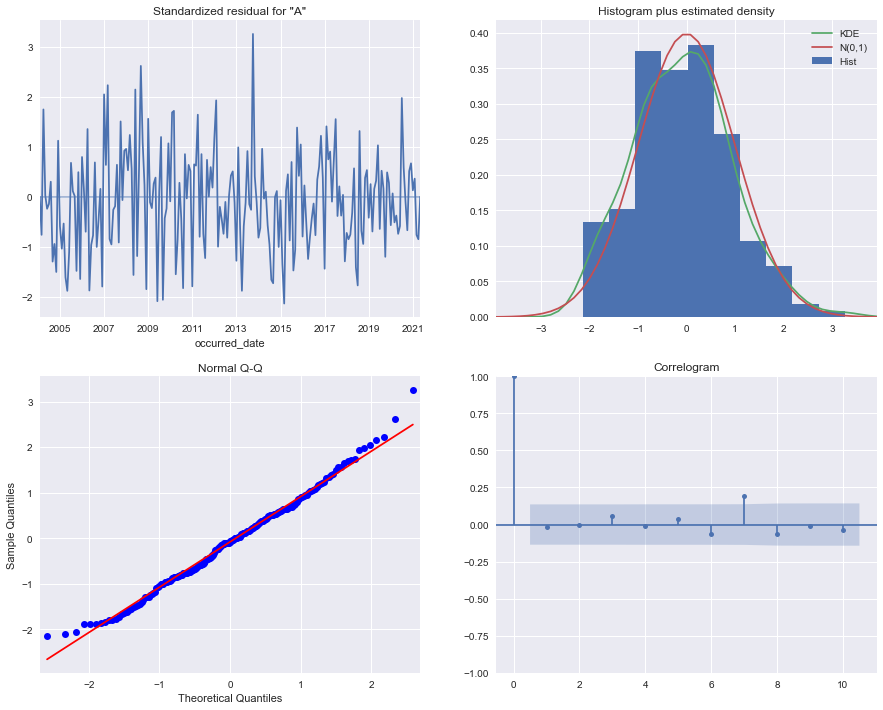

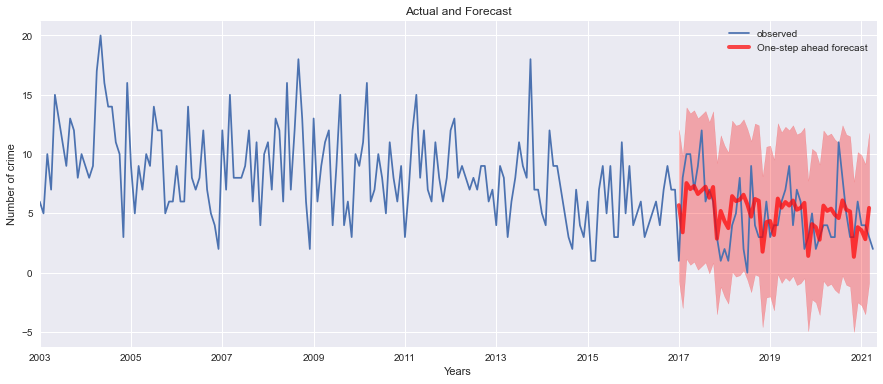

Training for: AGG ASSAULT ON PUBLIC SERVANT
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


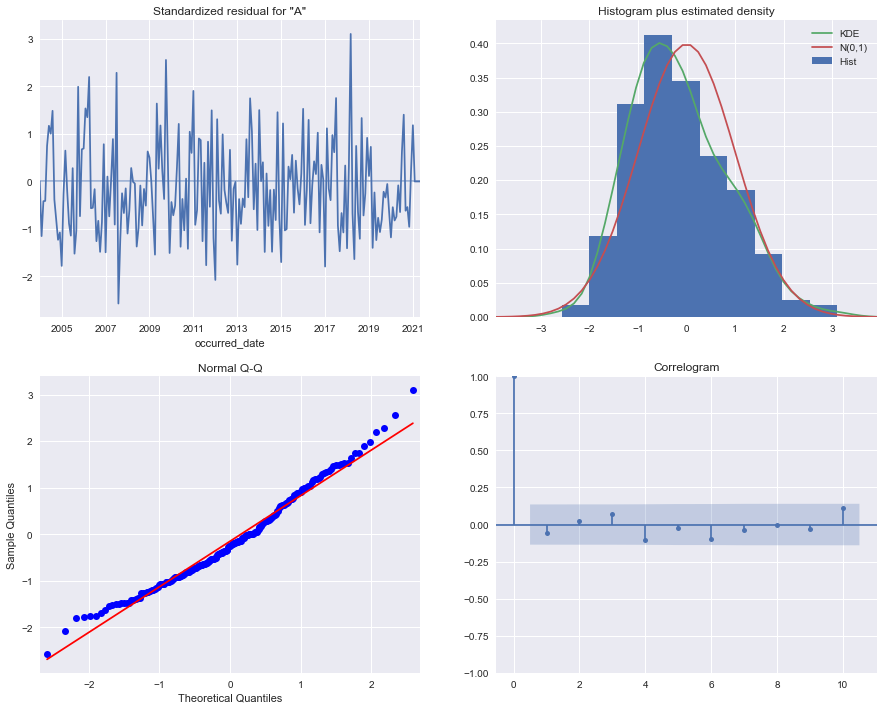

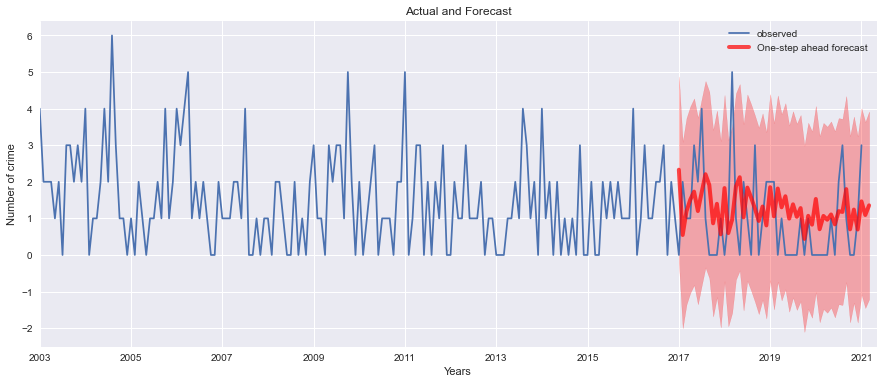

Training for: MURDER
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


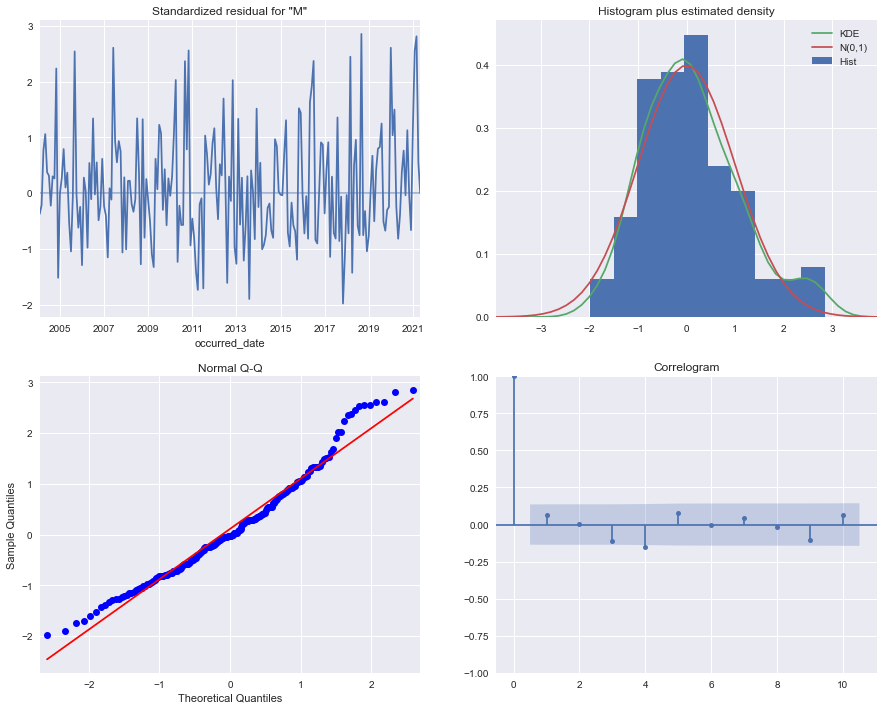

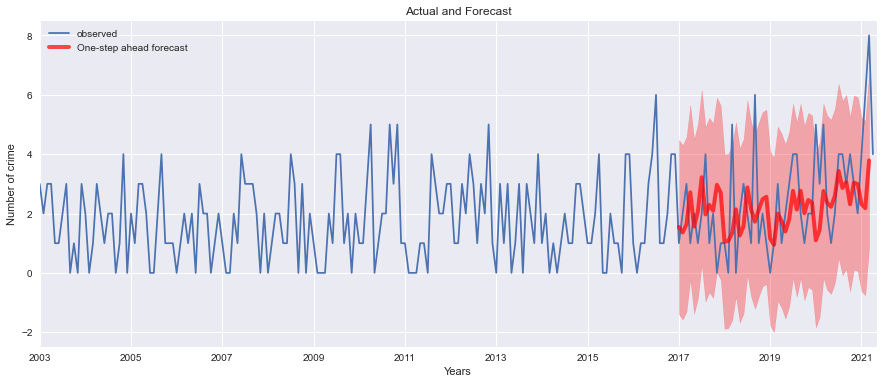

Training for: AGG ROBBERY BY ASSAULT
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


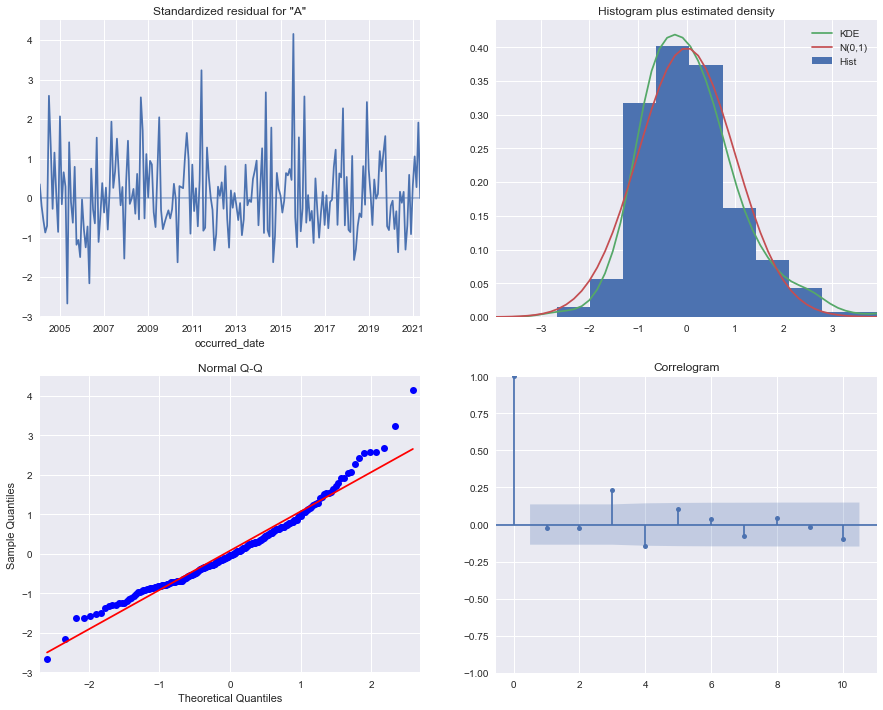

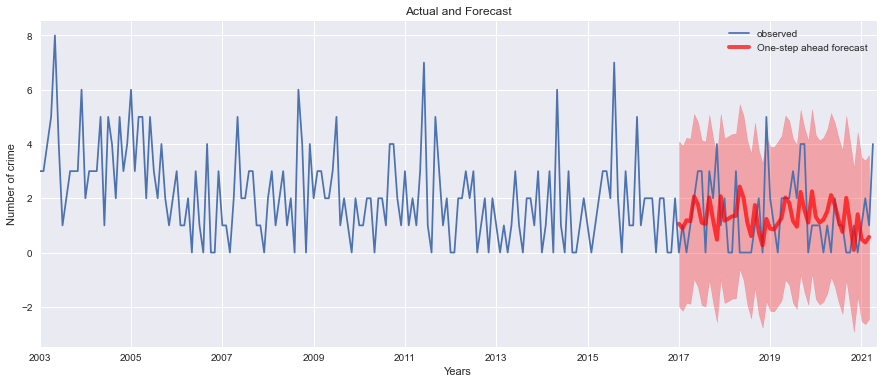

Training for: AGG RAPE OF A CHILD
 Calculating: 100%alculating: 36%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


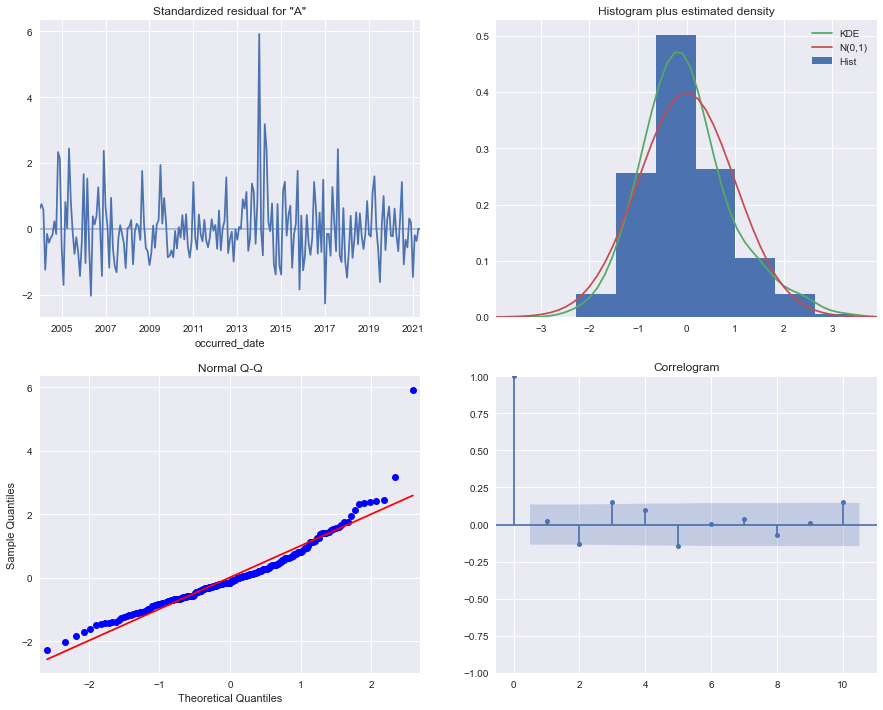

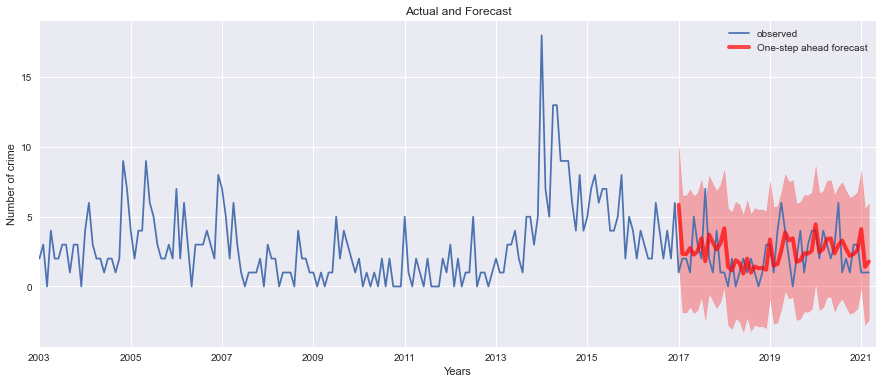

Training for: EXPIRED-ATT MURDER
 Calculating: 100%
Best parameters: SARIMA(1, 1, 1)x(1, 1, 1, 12)12


LinAlgError: singular matrix

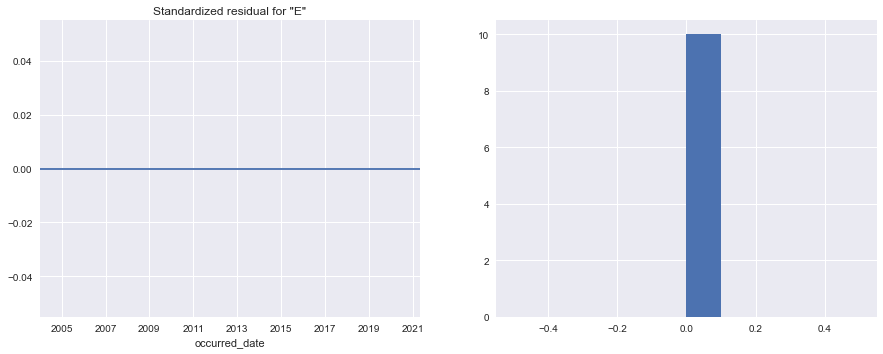

In [12]:
results = []
for i in crimeType:
    results.append(myArima(monthly[i]))

In [13]:
predictions = []
for i in range(0, len(results)):
    predictions.append(
        results[i].get_prediction(start=204, end=228, dynamic=False).predicted_mean
    )

In [14]:
# Calculating MAPE error
predictions = pd.DataFrame(predictions)
predictions = predictions.transpose()
predictions.columns = monthly.columns
errors = (monthly - predictions) / monthly
errors.dropna(how="all", inplace=True)
n = len(errors)

MAPE = round((errors.abs().sum() / n) * 100, 2)
print(
    "The Mean Absolute Percentage Error for each type for the year 01/2021 to 12/2021"
)
display(MAPE)

ValueError: Length mismatch: Expected axis has 11 elements, new values have 19 elements

In [15]:
# Formulating the confidence interval
predictions_ci = []
for i in range(0, len(results)):
    predictions_ci.append(
        results[i].get_prediction(start=204, end=228, dynamic=False).conf_int()
    )

# display(predictions_ci)

# Building a forecast table
def forecastMonth(year_month):
    for i in range(0, 9):
        pred_df = round(predictions.iloc[:, i : i + 1][year_month], 0)
        ci_df = round(predictions_ci[i][year_month], 0)
        ci_df.columns = ["Lower CI", "Upper CI"]
        frames = (pred_df, ci_df)
        display(pd.concat(frames, axis=1))


forecastMonth("2021-04")

,predicted_mean,Lower CI,Upper CI
2021-04-30,97.0,71.0,122.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,17.0,5.0,29.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,2.0,-4.0,8.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,46.0,25.0,68.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,35.0,21.0,49.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,3.0,-1.0,6.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,5.0,-2.0,11.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,1.0,-1.0,4.0


,predicted_mean,Lower CI,Upper CI
2021-04-30,3.0,0.0,6.0


## Predicting crime rates with Facebook Prophet 

### Modeling the data as-is

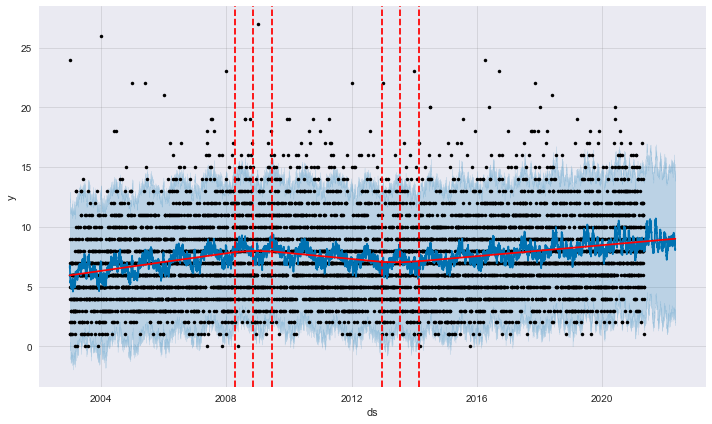

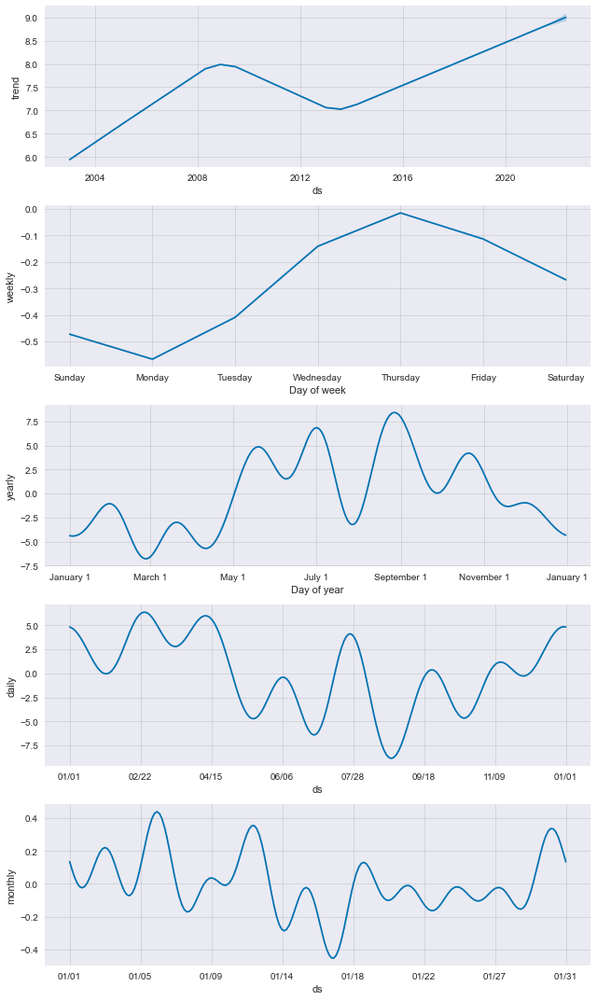

In [16]:
# Prepping to forecast
df_fbprophet = df.copy()
df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})
# df_m_final["y"] = np.log(df_m_final["y"])
df_m_final["y"] = pd.to_numeric(df_m_final["y"])
y = df_m_final["y"].to_frame()
y.index = df_m_final["ds"]
n = np.int(y.count())

# Fitting and configuring the model
m = Prophet(interval_width=0.95)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)

fig2_1 = plot_plotly(m, forecast)
fig2_1

In [17]:
# The forecast is 'log transformed', so we need to 'inverse' it back by using the exp
forecast_df_exp = np.exp(forecast[["yhat", "yhat_lower", "yhat_upper"]])
forecast_df_exp.index = forecast["ds"]

# Calculating MAPE error
error = forecast_df_exp["yhat"] - y["y"]
MAPE_df = (error / y["y"]).abs().sum() / n * 100
round(MAPE_df, 2)

inf

### Mitigating outlier effects on moodel accuracy 

In [18]:
# Make another copy of the data frame as m2
df_prophet2 = df_m_final.copy()

# Define the Upper Control Limit and Lower Control Limit as 3 standard deviations from the mean
ucl = df_prophet2.mean() + df_prophet2.std() * 3
lcl = df_prophet2.mean() - df_prophet2.std() * 3

# display the number of outliers found
print(
    "Above 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] > ucl["y"]]["y"].count(),
    "entries",
)
print(
    "Below 3 standard deviations: ",
    df_prophet2[df_prophet2["y"] < lcl["y"]]["y"].count(),
    "entries",
)

Above 3 standard deviations:  49 entries
Below 3 standard deviations:  0 entries


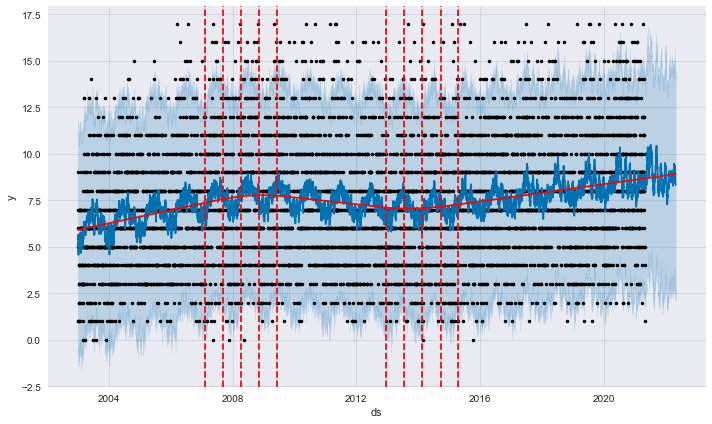

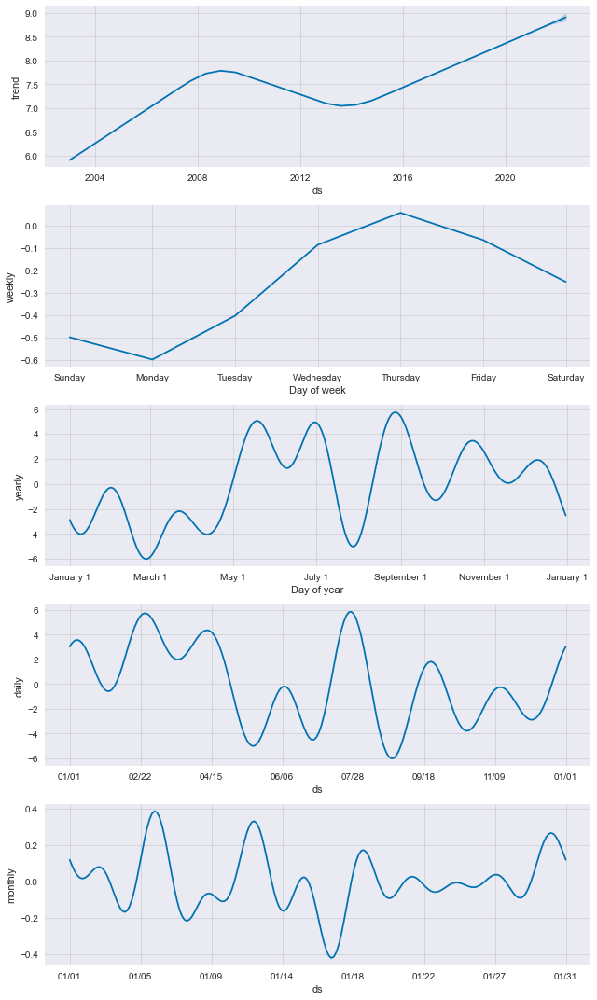

In [19]:
# Remove them by setting their value to None. Prophet says it can handle null values.
df_prophet2.loc[df_prophet2["y"] > ucl["y"], "y"] = None
df_prophet2.loc[df_prophet2["y"] < lcl["y"], "y"] = None

# Log transformation
# df_prophet2["y"] = np.log(df_prophet2["y"])
df_prophet2["y"] = pd.to_numeric(df_prophet2["y"])

# Run Prophet using model 2
m2 = Prophet(interval_width=0.95)
m2.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m2.add_seasonality(name="weekly", period=52, fourier_order=10)
m2.add_seasonality(name="daily", period=365, fourier_order=10)
m2.fit(df_prophet2)

future = m2.make_future_dataframe(periods=365)

forecast_m2 = m2.predict(future)

fig_m2 = m2.plot(forecast_m2)
a = add_changepoints_to_plot(fig_m2.gca(), m2, forecast_m2)

fig2m2 = m2.plot_components(forecast_m2)

fig2_1m2 = plot_plotly(m2, forecast_m2)
fig2_1m2

In [20]:
# Re-inversing the forecast

forecast_m2_exp = np.exp(forecast_m2[["yhat", "yhat_lower", "yhat_upper"]])
forecast_m2_exp.index = forecast_m2["ds"]

# RecalculatinG MAPE error

error = forecast_m2_exp["yhat"] - y["y"]
MAPE_m2 = (error / y["y"]).abs().sum() / n * 100
round(MAPE_m2, 2)

inf

  0%|          | 0/4 [00:00<?, ?it/s]

,horizon,mse,rmse,mae,mape,mdape,coverage
0,37 days,10.474391,3.236416,2.607985,0.458795,0.284420,0.930556
1,38 days,10.458671,3.233987,2.609711,0.458409,0.282660,0.930556
2,39 days,10.651400,3.263648,2.660674,0.464502,0.282660,0.932292
3,40 days,10.574881,3.251904,2.657924,0.466627,0.279569,0.937500
4,41 days,11.078608,3.328454,2.726571,0.493337,0.285856,0.930556


,horizon,mse,rmse,mae,mape,mdape,coverage
324,361 days,7.982232,2.825284,2.178902,0.341242,0.222666,0.951389
325,362 days,7.849959,2.801778,2.181779,0.326453,0.222666,0.958333
326,363 days,8.031594,2.834007,2.222653,0.339149,0.232923,0.958333
327,364 days,8.144870,2.853922,2.226620,0.331200,0.232923,0.951389
328,365 days,8.854390,2.975633,2.322166,0.410114,0.249160,0.937500


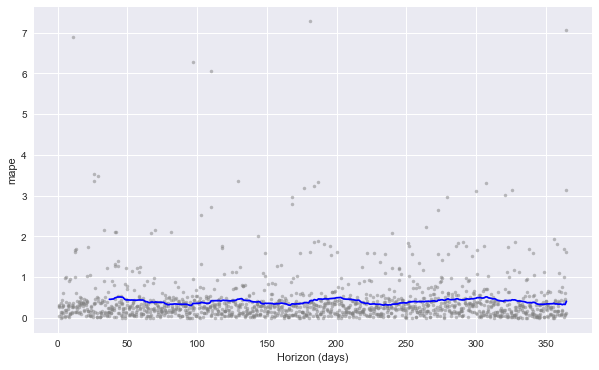

In [21]:
# Doing a diagnostic and performance metrics check visualizing the results

b = cross_validation(m2, initial="5110 days", period="365 days", horizon="365 days")

p = performance_metrics(b)
display(p.head())
display(p.tail())

fig4 = plot_cross_validation_metric(b, metric="mape")